In [2]:
from time import time
import matplotlib.pyplot as plt
import numpy as np
import scipy as sp
import scanpy as sc
from bbknn import bbknn
import scanorama
import pandas as pd
from matplotlib import rcParams


sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.set_figure_params(dpi=100)

scanpy==1.6.0 anndata==0.7.4 umap==0.3.10 numpy==1.17.2 scipy==1.5.2 pandas==1.1.0 scikit-learn==0.21.3 statsmodels==0.10.1 python-igraph==0.7.1 louvain==0.6.1 leidenalg==0.7.0


# Cluster each age separately

In [4]:
P8_gaba = sc.read_h5ad('P8gaba_raw.h5ad')

In [3]:
P8_gaba

AnnData object with n_obs × n_vars = 2836 × 30869
    obs: 'batch', 'n_genes', 'percent_mito', 'n_counts', 'leiden', 'Doublet', 'Doublet Score', 'cluster', 'Class_broad', 'cluster_name'
    var: 'gene_ids', 'feature_types', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'

In [4]:
sc.pp.highly_variable_genes(P8_gaba, min_mean=0.0125, max_mean=3, min_disp=0.5) #HVGs
sc.pp.scale(P8_gaba, max_value=10) #scale

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [5]:
sc.tl.pca(P8_gaba, svd_solver='arpack') #run PCA
sc.pp.neighbors(P8_gaba, n_neighbors=10, n_pcs=40) #choose 25 standard for now
sc.tl.leiden(P8_gaba)
sc.tl.umap(P8_gaba)

computing PCA
    on highly variable genes
    with n_comps=50


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


    finished (0:00:02)
computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
running Leiden clustering
    finished: found 14 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)


In [6]:
P8_gaba_CBs = list(P8_gaba.obs.index)
P8_gaba_batch = []
for i in range(len(P8_gaba_CBs)):
    P8_gaba_batch.append(P8_gaba_CBs[i][19:24])
    
P8_gaba.obs['sample'] = P8_gaba.obs['batch']
P8_gaba.obs['sample'] = P8_gaba_batch

In [3]:
P8_gaba = sc.read_h5ad('P8_gaba0828.h5ad')

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


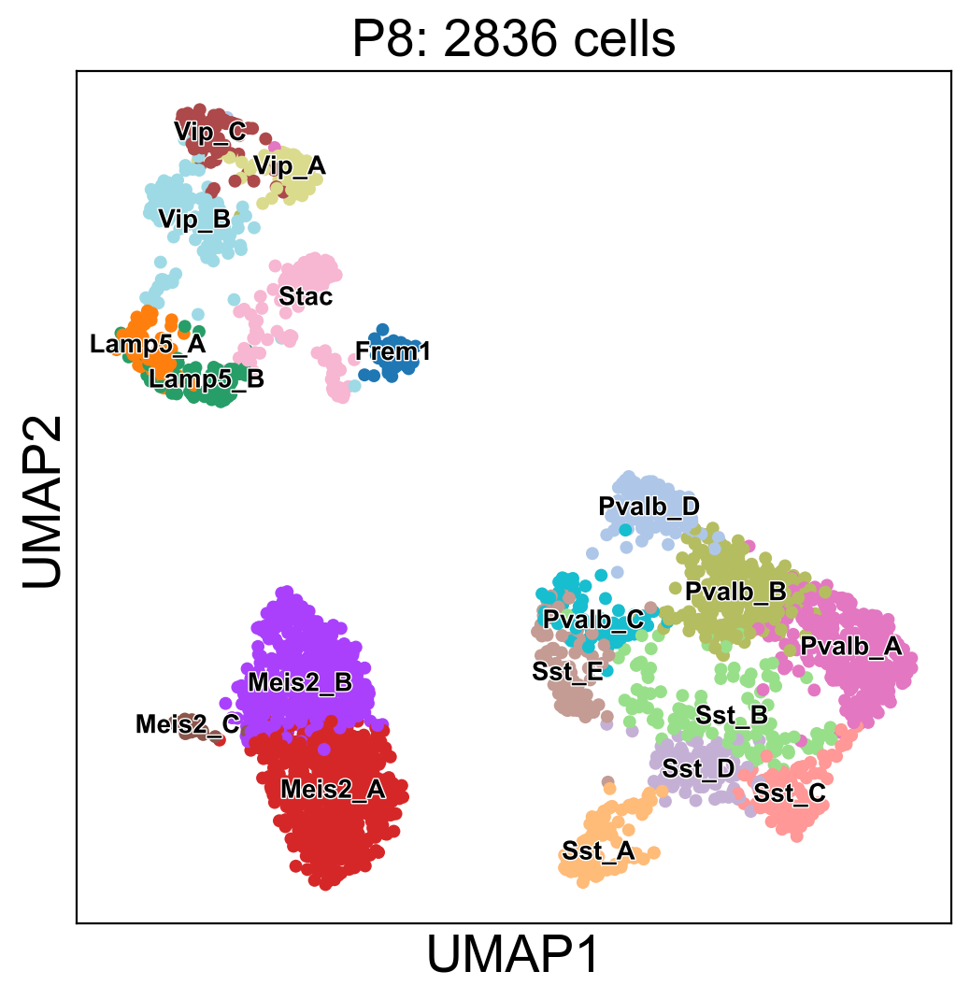

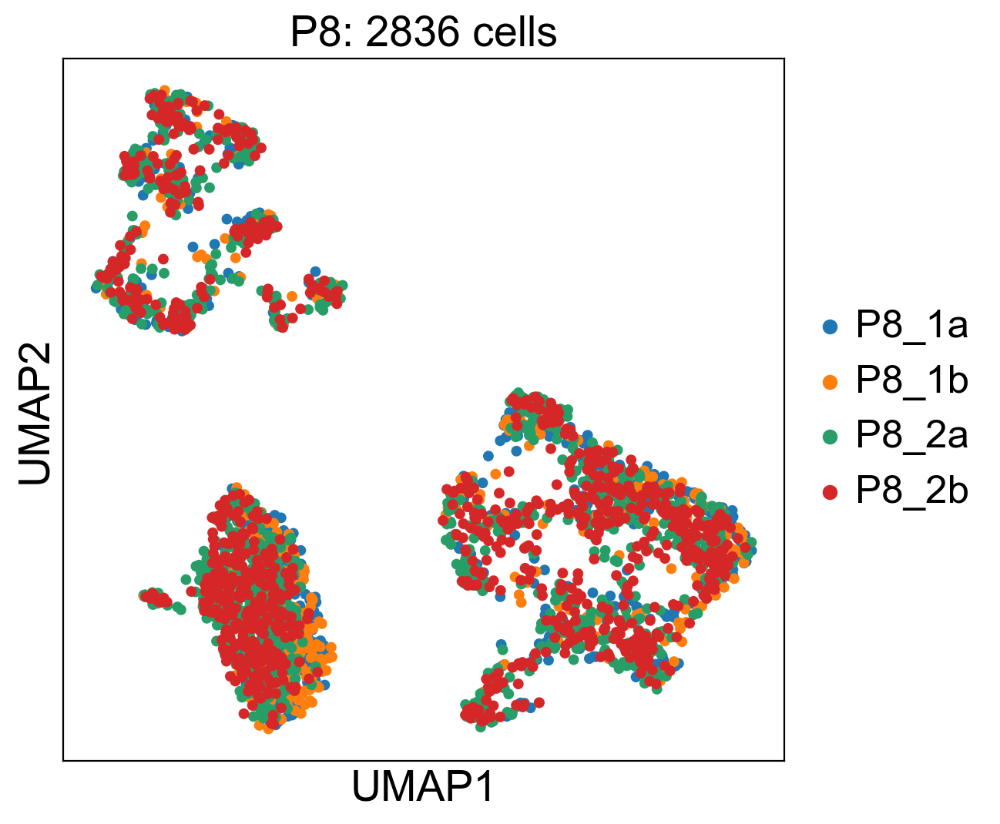

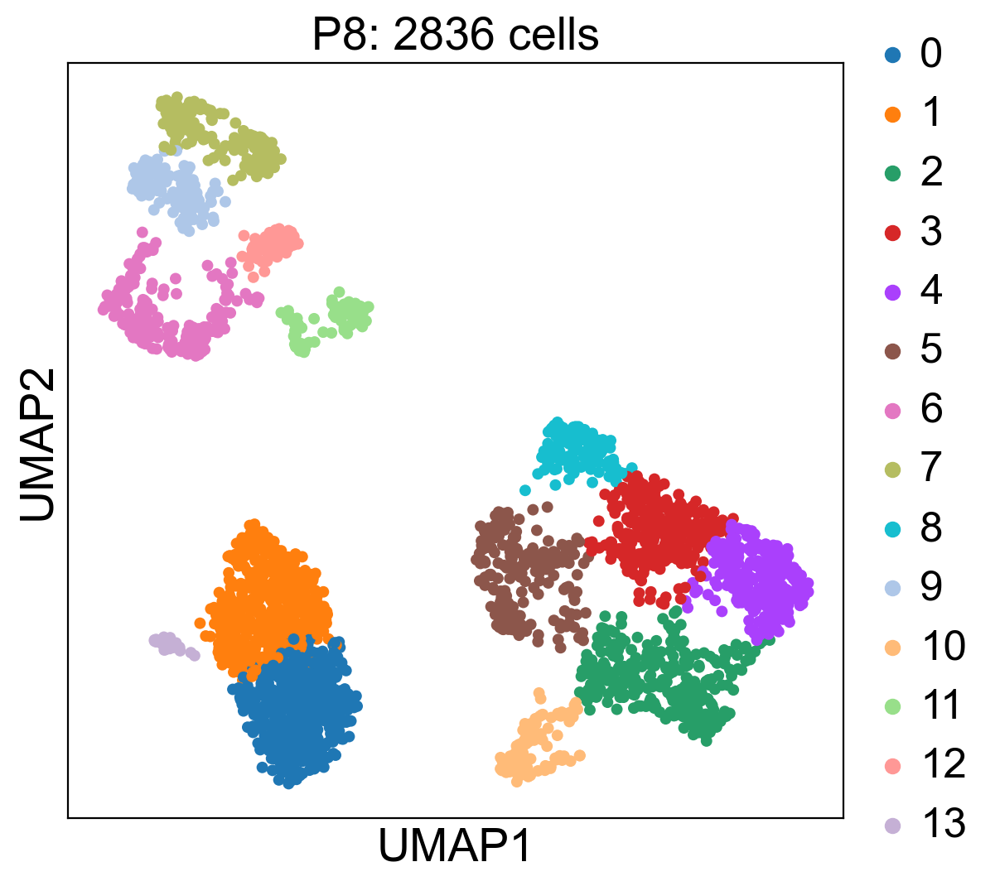

In [15]:
sc.set_figure_params(dpi=100, figsize=(6,6), dpi_save=2000, fontsize=20)
sc.pl.umap(P8_gaba, color='cluster_name', 
           title = 'P8: ' + str(P8_gaba.shape[0]) + ' cells', frameon=True, legend_loc='on data', legend_fontoutline=1,size=100, legend_fontsize='10')
sc.pl.umap(P8_gaba, color='sample', title = 'P8: ' + str(P8_gaba.shape[0]) + ' cells', frameon=True, size = 100)

sc.pl.umap(P8_gaba, color='leiden', title = 'P8: ' + str(P8_gaba.shape[0]) + ' cells', frameon=True, size = 100)

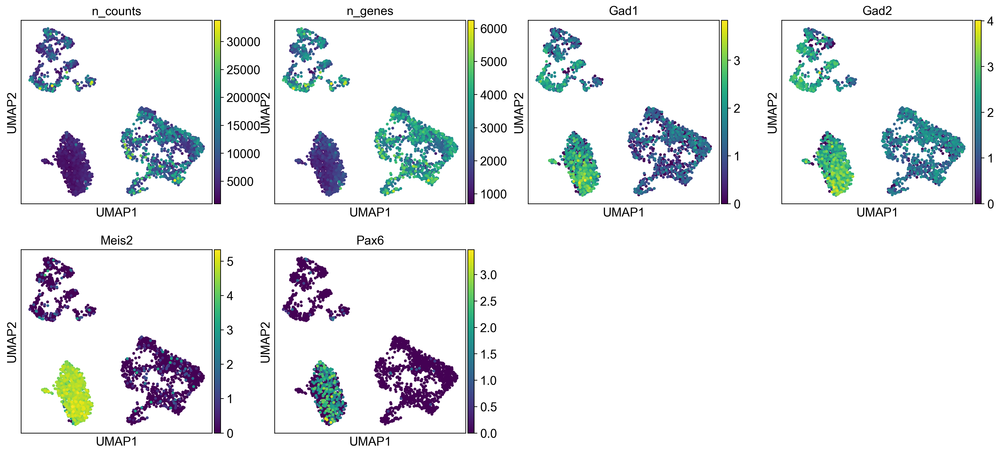

In [11]:
sc.pl.umap(P8_gaba, color=['n_counts', 'n_genes', 'Gad1', 'Gad2', 'Meis2', 'Pax6'])

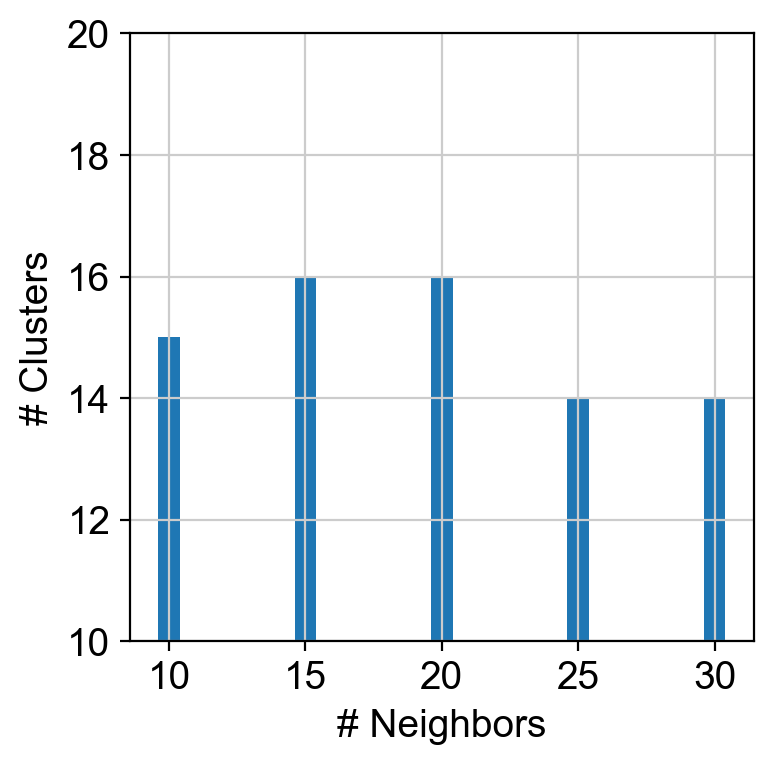

In [140]:
plt.bar([10,15, 20, 25, 30], [15, 16, 16, 14, 14])
plt.xlabel('# Neighbors')
plt.ylabel('# Clusters')
plt.ylim(10, 20)
plt.show()

Number of neighbors: number of clusters

10: 15,
15: 16,
20: 16,
25: 14,
30: 14

In [5]:
cluster_dict = {0:'Pvalb_1', 1:'Pvalb_2', 2:'Pvalb/Ambig_3', 3:'Vip_1', 4:'Lamp5', 5:'Vip_2', 6:'Ambig_1', 7:'Pvalb_4', 
                8:'Sst_2', 9:'Sst_3', 10:'Sst_1', 11:'Sst_4', 12:'remove', 13:'Ambig_2'}
cluster = []
for i in cluster_dict: cluster.append((cluster_dict[i]))

P8_gaba.obs['cluster'] = P8_gaba.obs['leiden']
P8_gaba.rename_categories(key='cluster', categories=cluster)

### Finalize type names P8

* Make a new obs called `cluster_name`
* In that obs have A, B, C 

Splitting lists

In [206]:
P8_gaba.obs['cluster_name'] = P8_gaba.obs['cluster']
P8_gaba.obs['cluster_name'] = pd.Series(cluster_namesP8, dtype="category").values #32 in 'remove'

In [207]:
P8_gaba = P8_gaba[P8_gaba.obs['cluster_name']!='remove',:]

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [13]:
layer_markers = ['Slc17a7',
    'Cux2', 'Ccbe1', 'Mdga1', 
              'Whrn', 'Rorb',
              'Deptor', 
              'Nxph1', 'Tshz2', 'Trhr', 'Slc17a8', 
              'Bcl6', 'Erg', 'Reln', 
              'Cdh9', 'Zfp804b',
              'Foxp2', 'Syt6',
              'Ctgf', 'Inpp4b', 'Svil']

/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


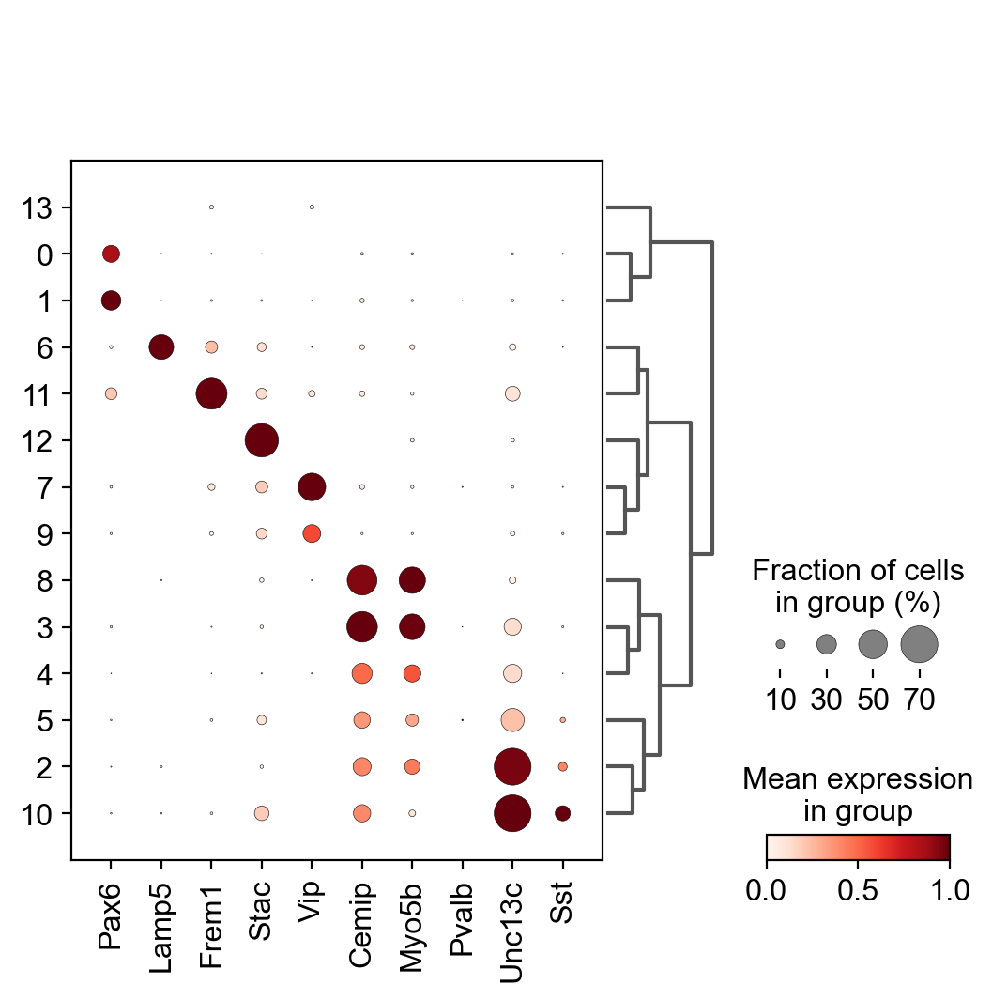

In [14]:
#sc.tl.dendrogram(P8_gaba, groupby='cluster_name')
bias_markers = ['Pax6', 'Lamp5',
                'Frem1',
                'Stac',
                'Vip',
                
                 'Cemip', 'Myo5b', 'Pvalb','Unc13c', 'Sst']

sc.pl.dotplot(P8_gaba, bias_markers, groupby='leiden', 
                   dendrogram=True, standard_scale='var', dot_max=0.7)
#sc.pl.dotplot(P8_gaba, layer_markers, groupby='cluster_name', dendrogram=True)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


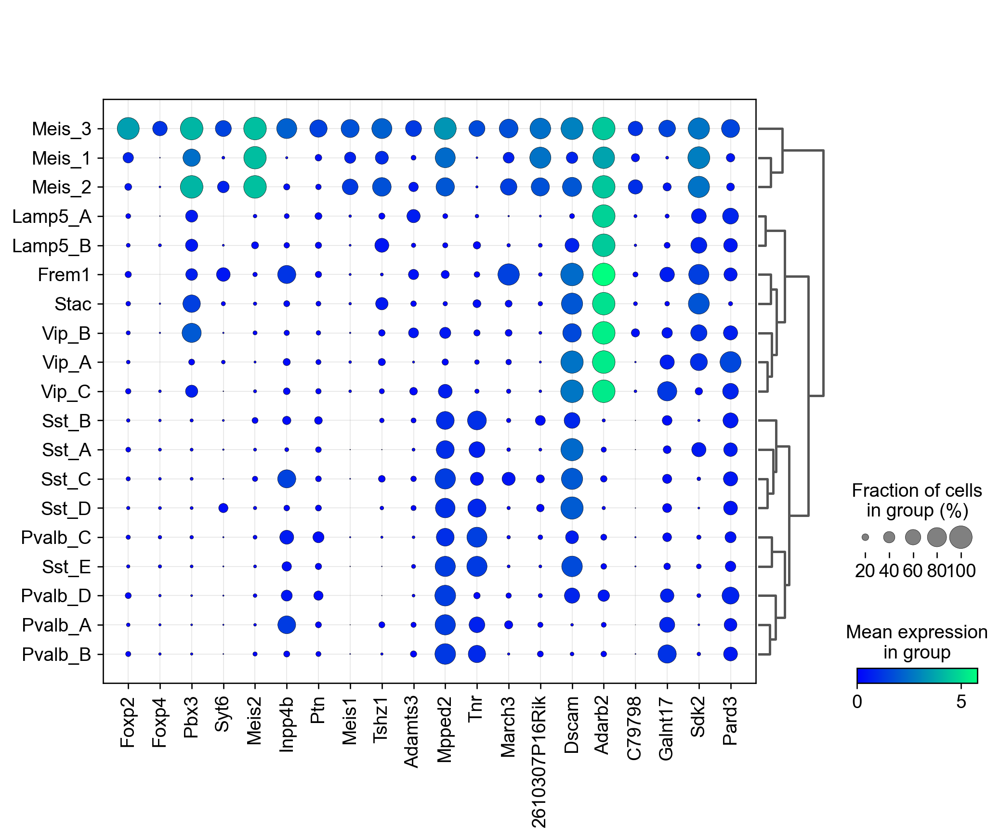

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


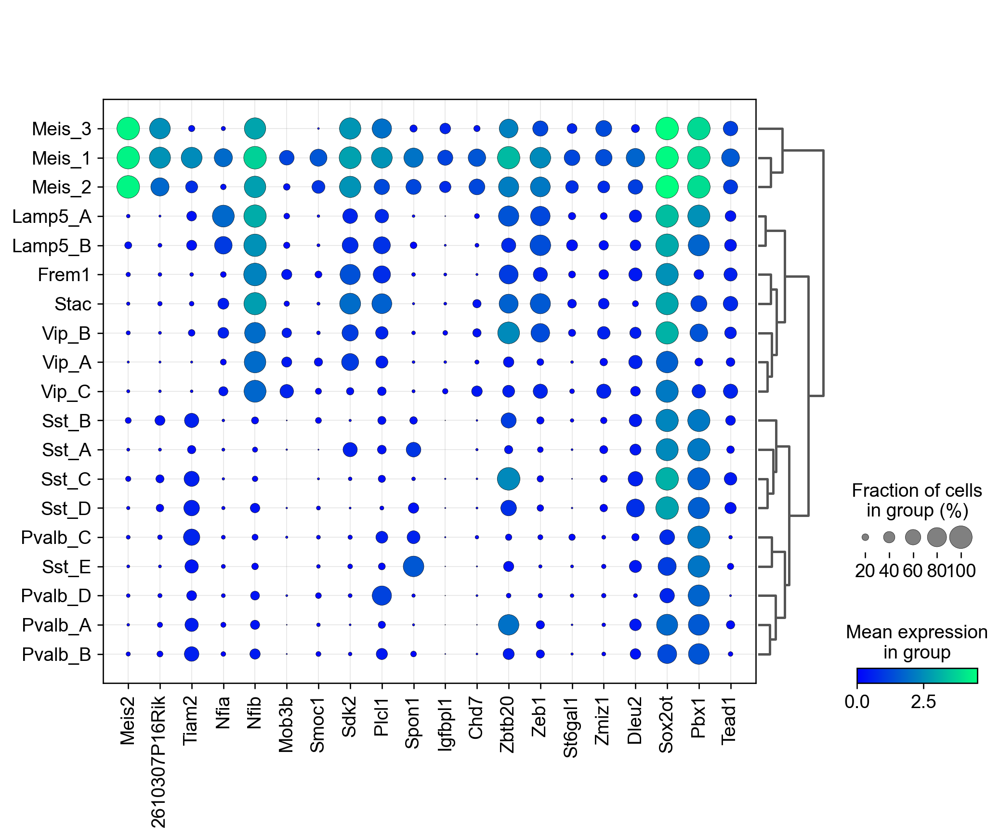

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


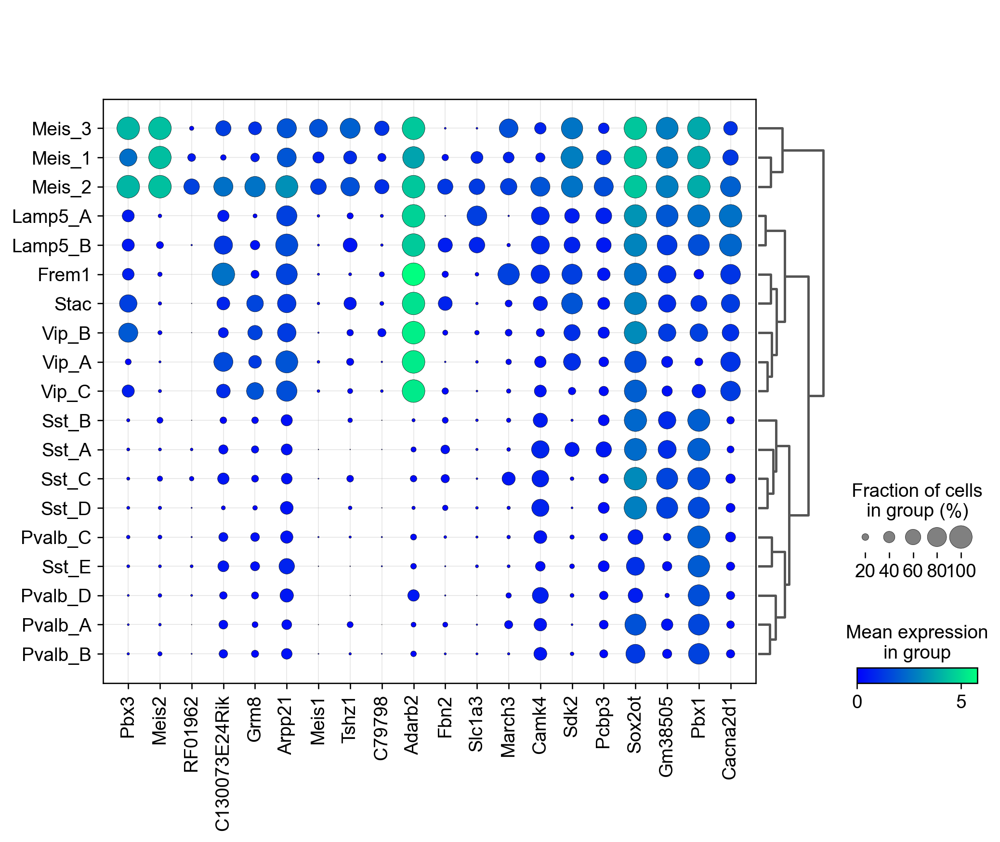

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


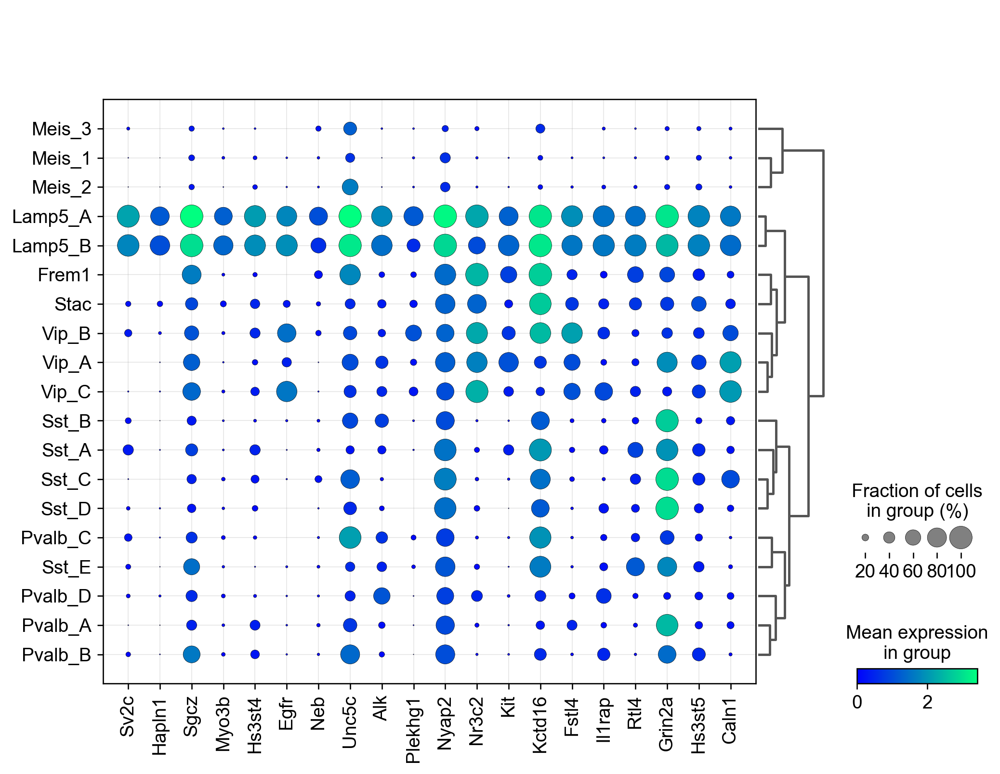

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


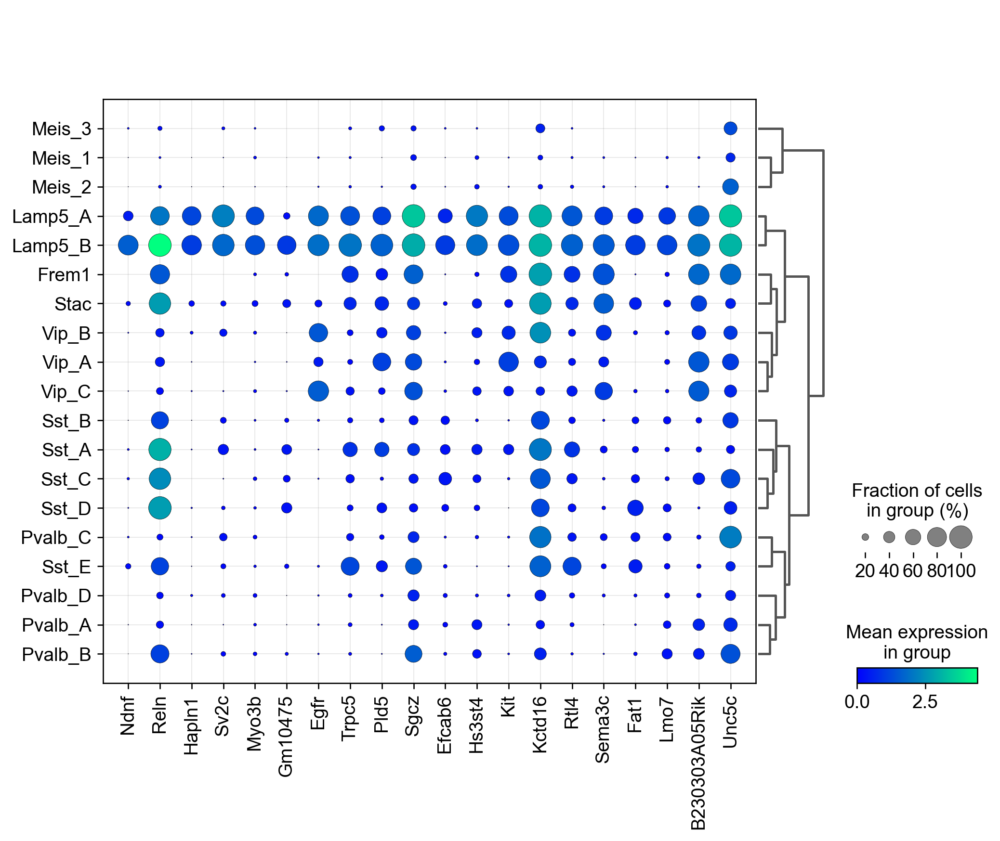

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


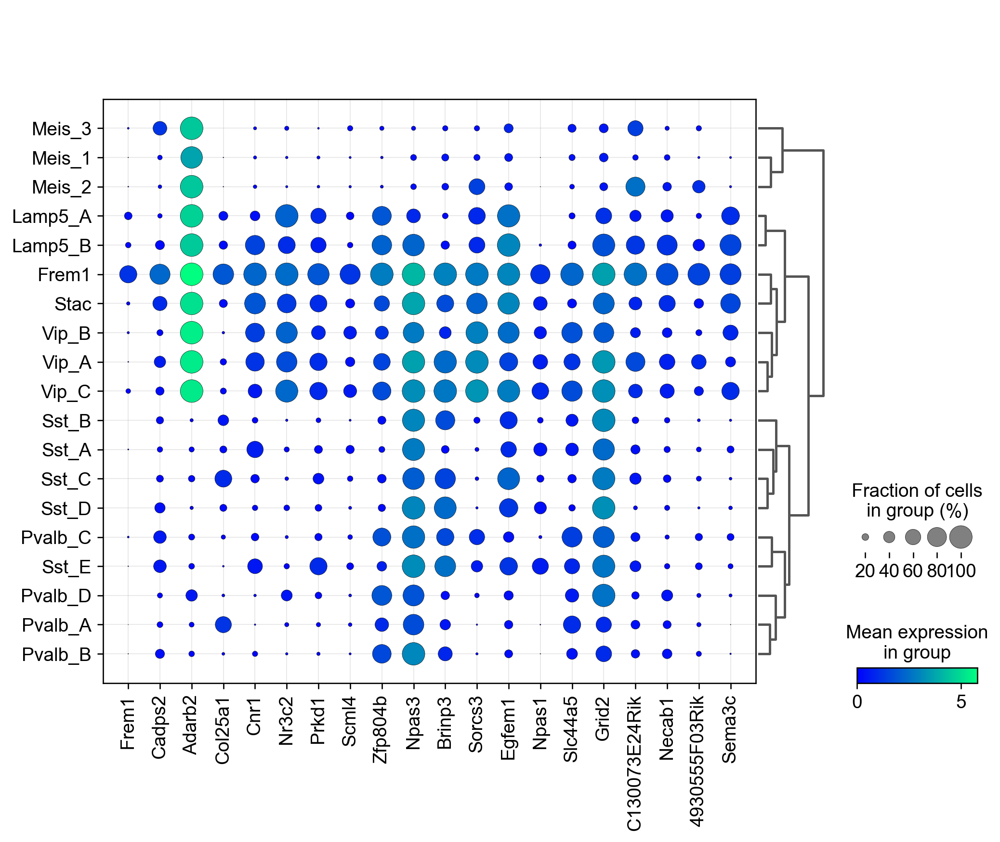

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


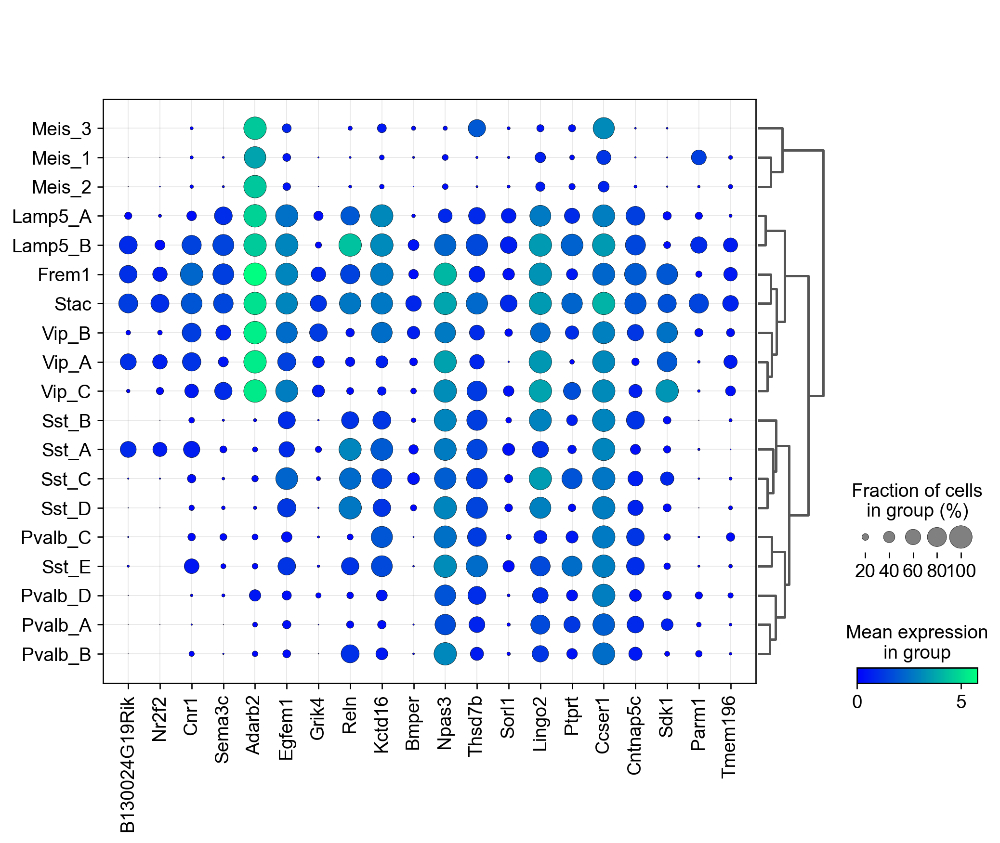

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


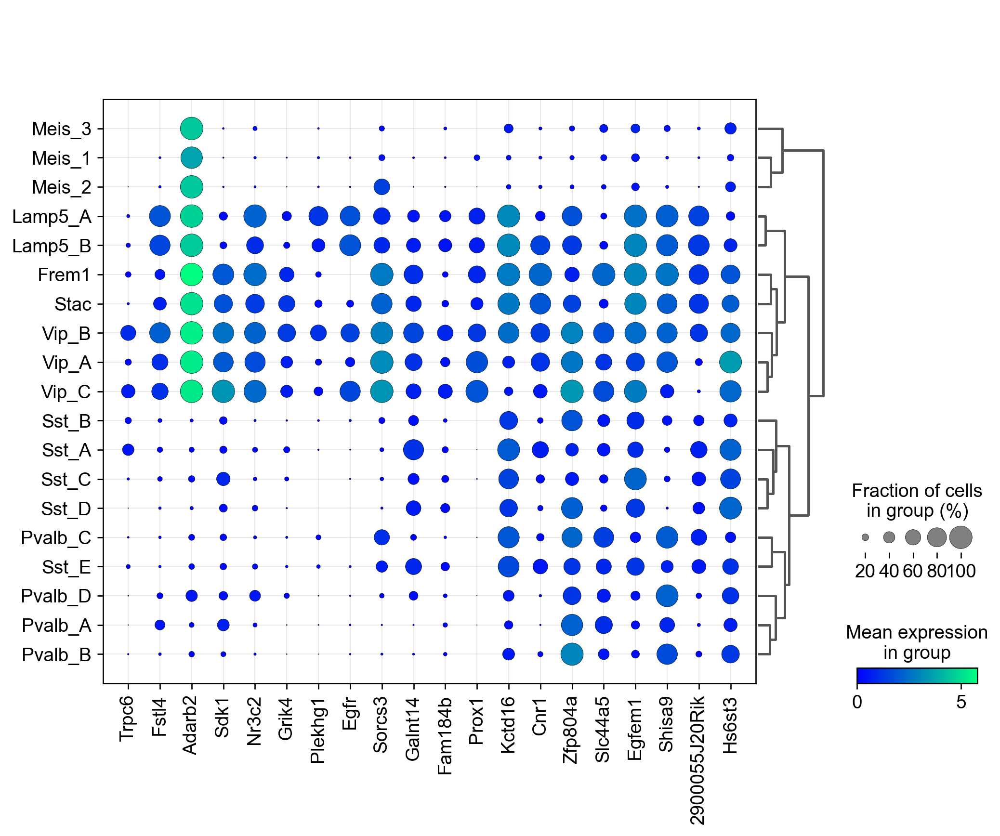

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


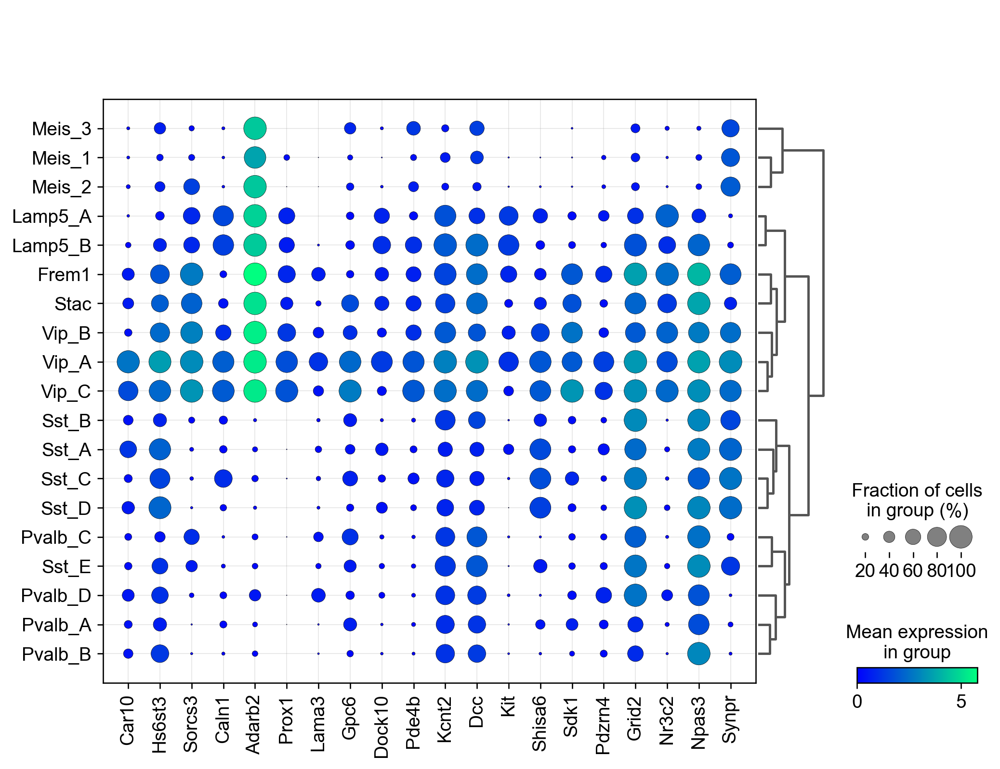

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


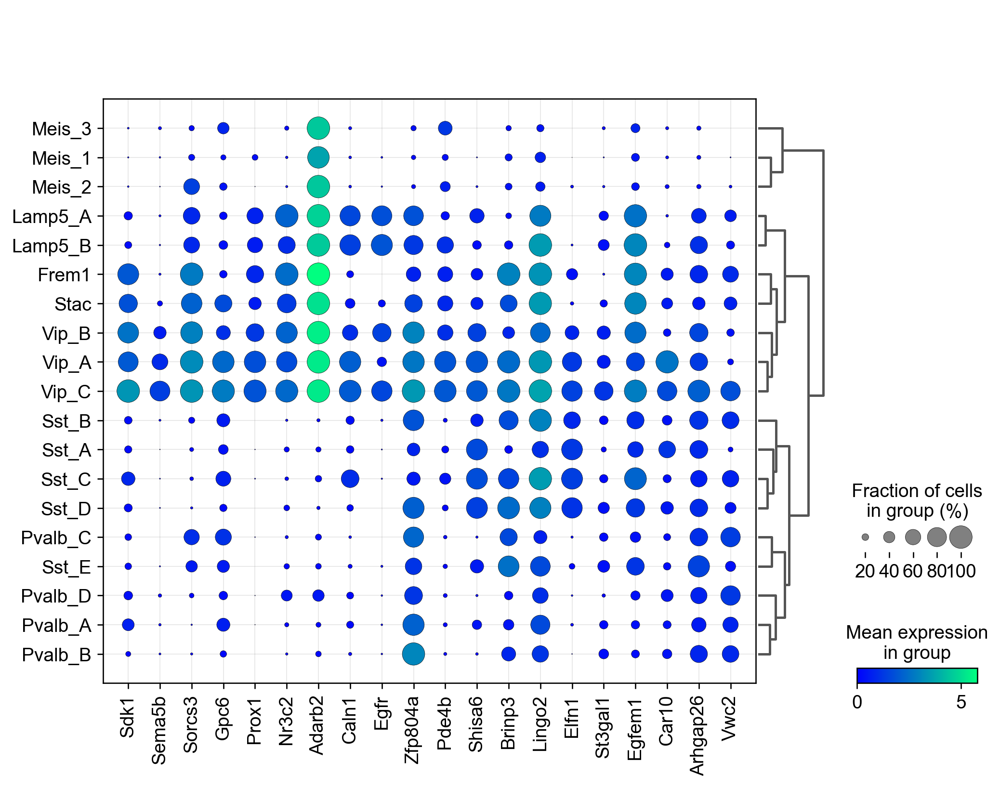

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


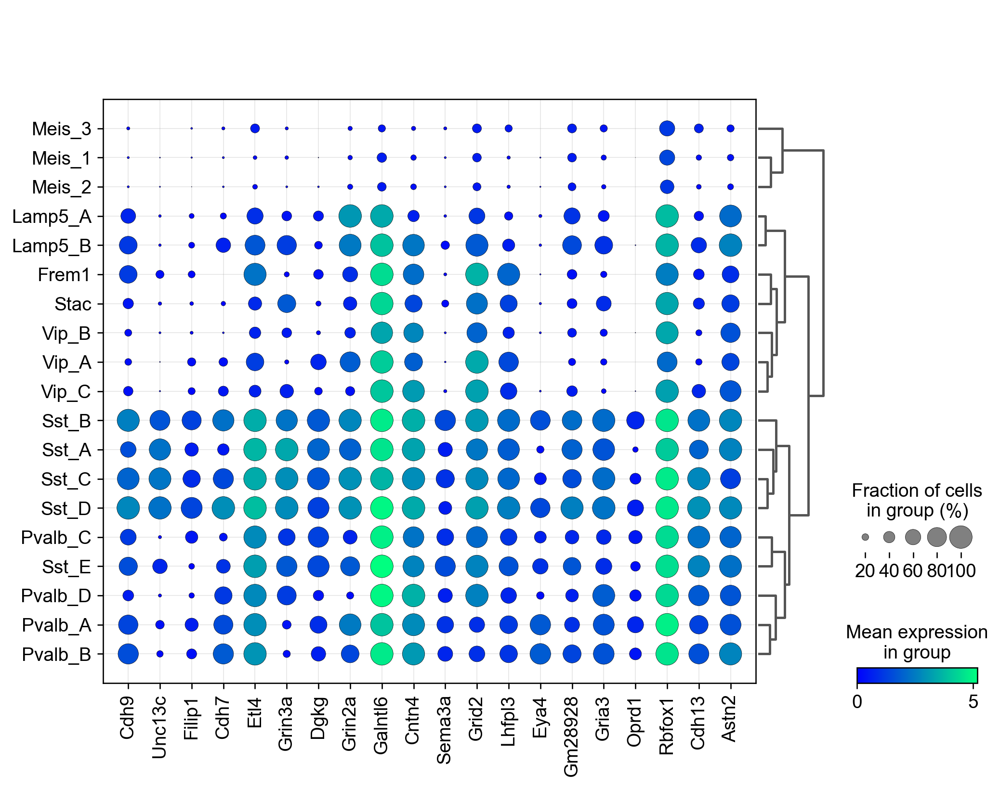

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


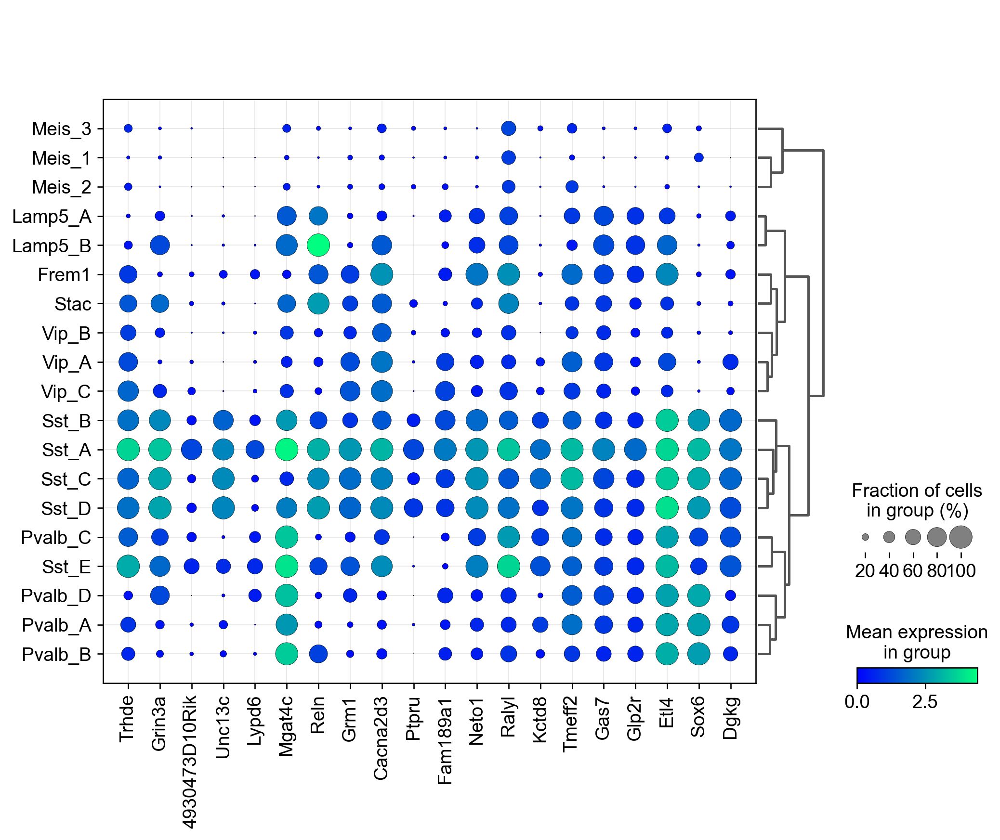

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


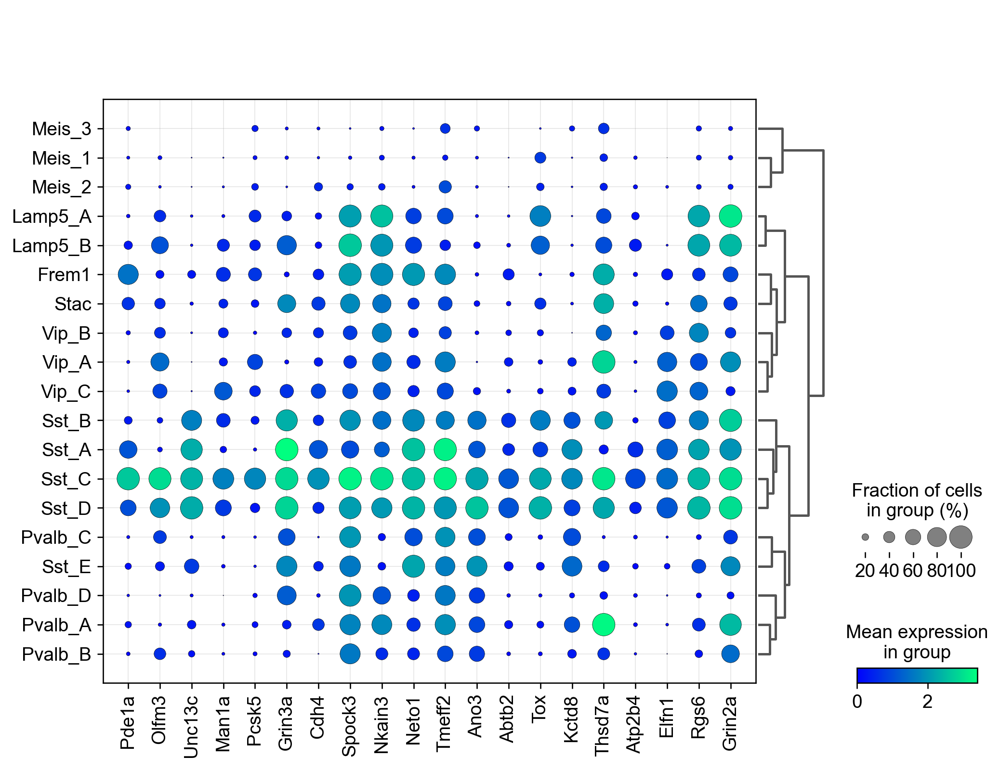

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


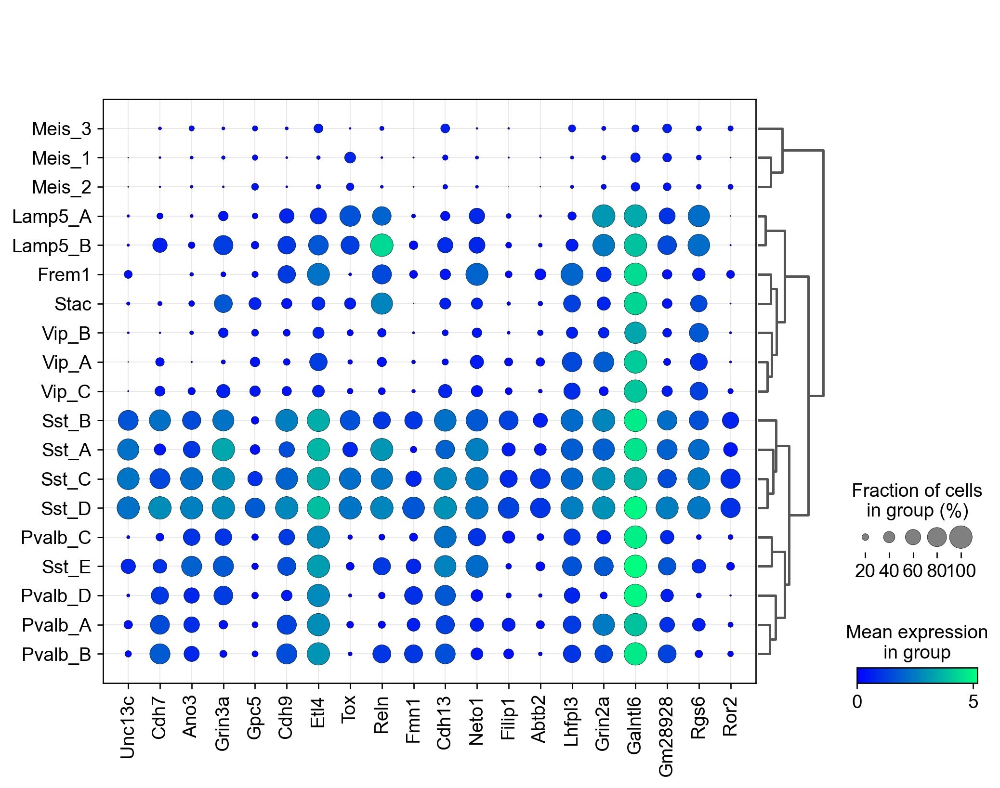

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


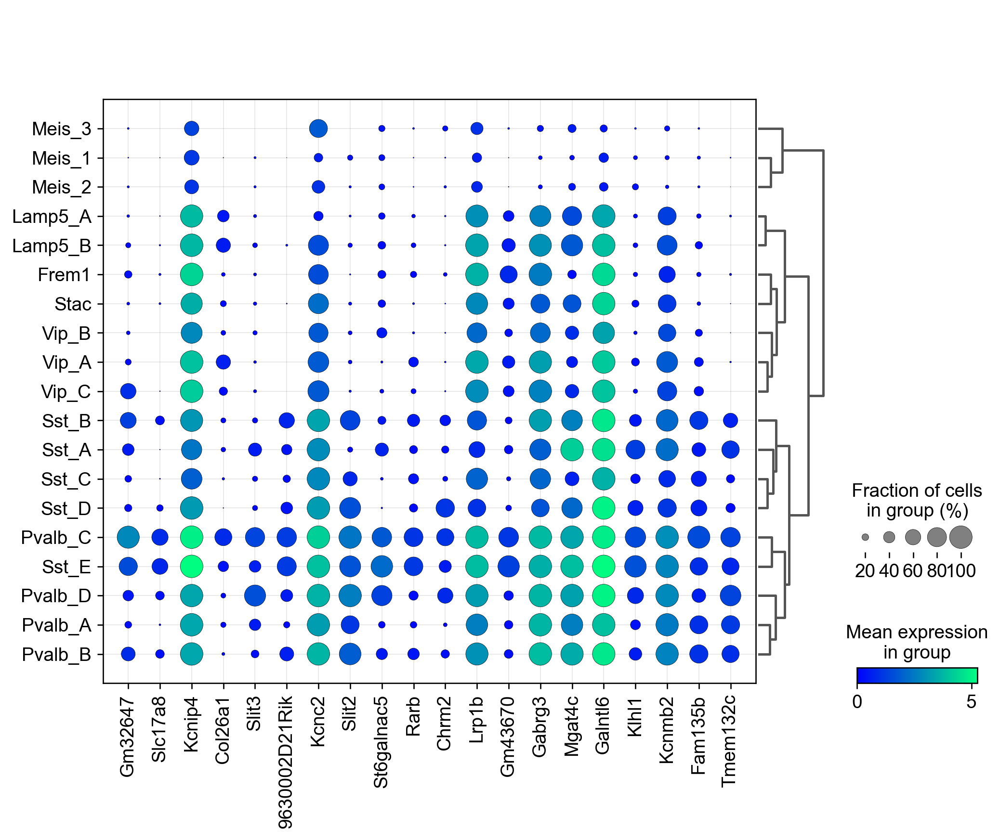

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


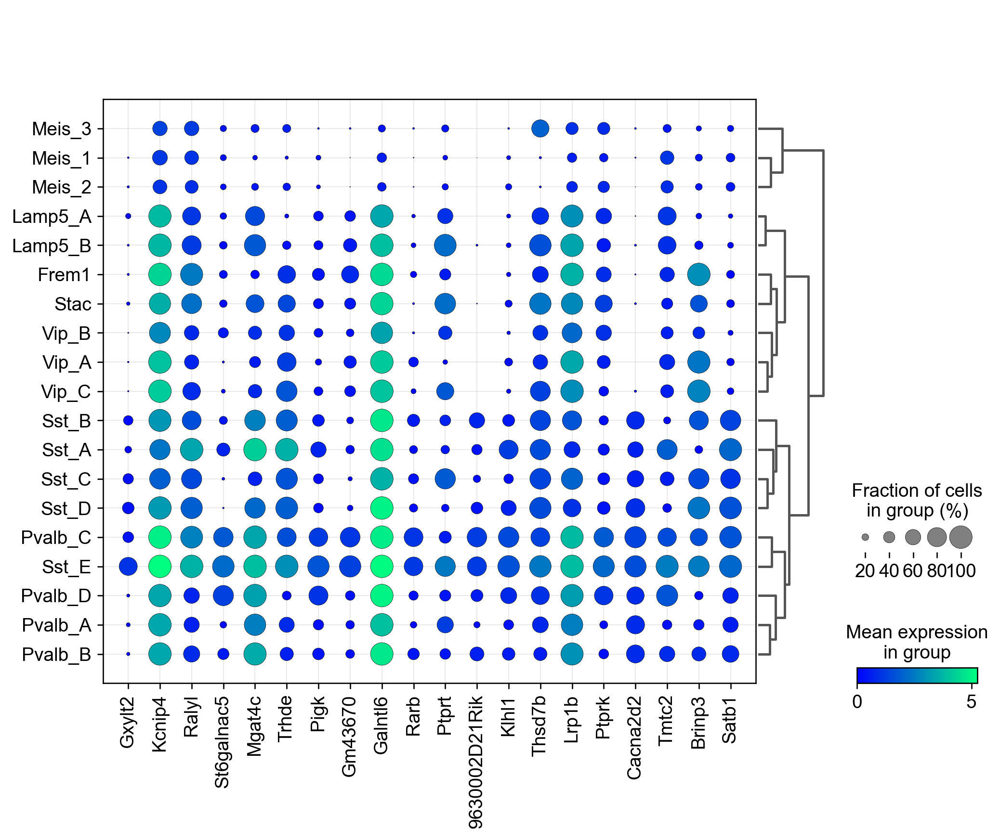

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


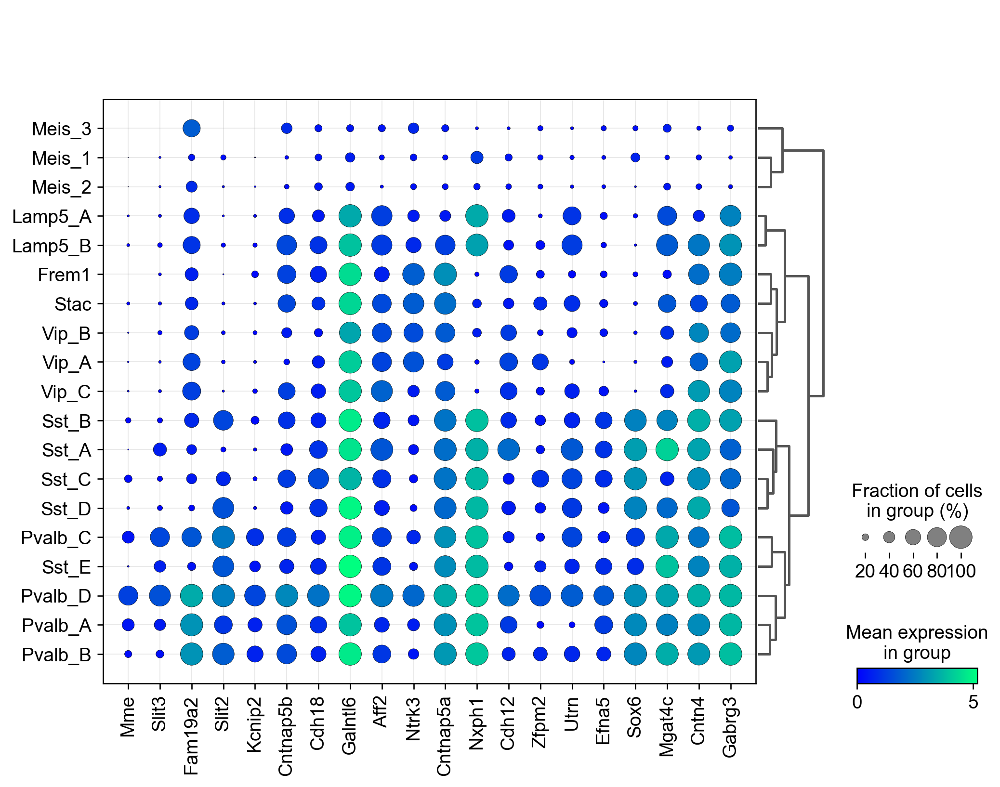

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


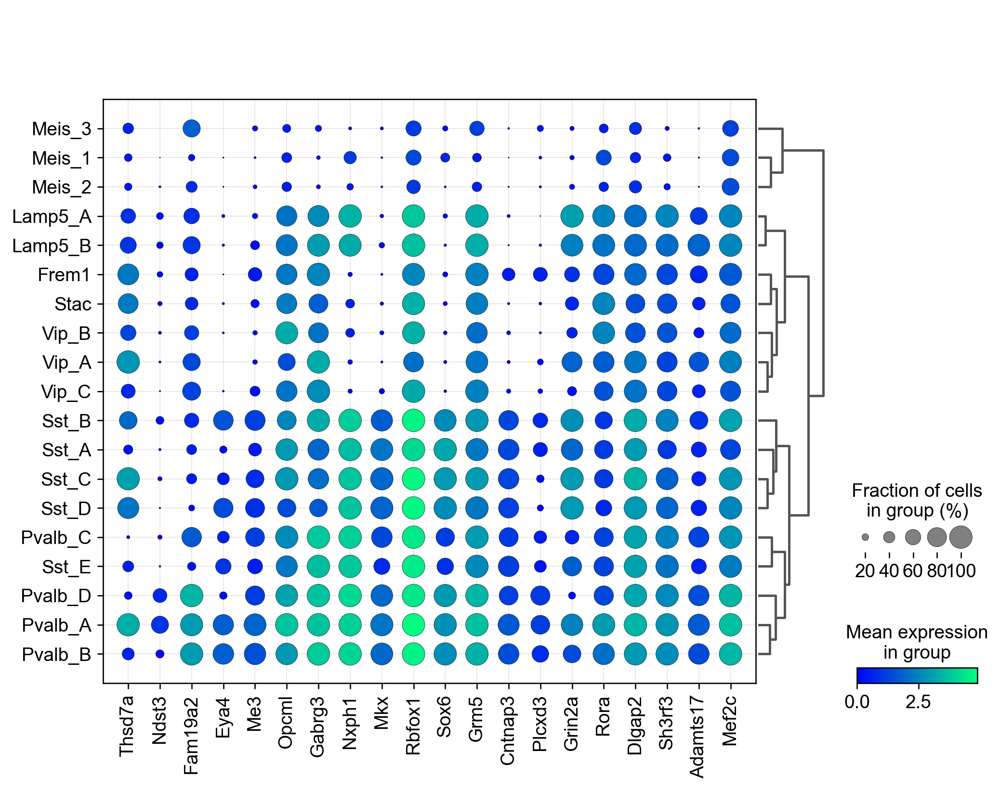

ranking genes


/Users/salwanbutrus/opt/anaconda3/lib/python3.7/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:05)


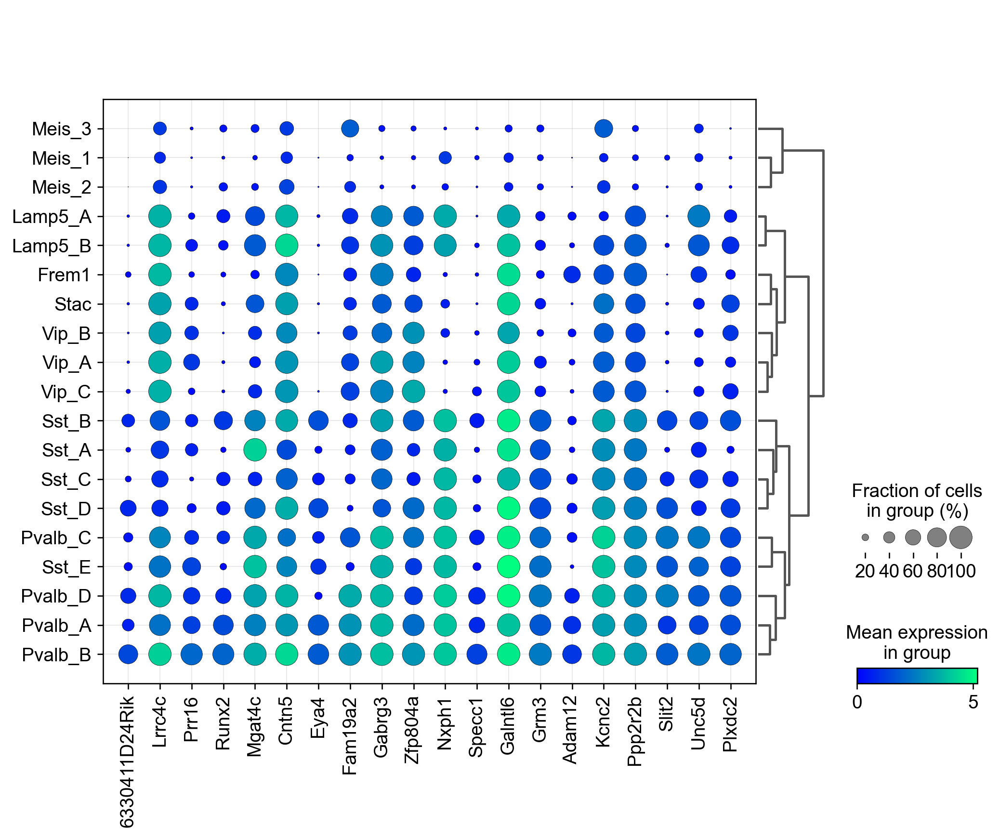

In [51]:
for i in P8_gaba.uns["dendrogram_['cluster_name']"]['categories_ordered']:
    cluster = i
    sc.tl.rank_genes_groups(P8_gaba, groupby='cluster_name', groups=[cluster], reference='rest', method='wilcoxon', n_genes=50)
    #wilcGenes23vRest = list(P8_gaba.uns['rank_genes_groups']['names'].astype([(cluster, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    #if ('Malat1' in wilcGenes23vRest): del wilcGenes23vRest[wilcGenes23vRest.index('Malat1')]

    wilcLF8v14 = P8_gaba.uns['rank_genes_groups']['logfoldchanges'].astype([(cluster, '<f8')]).view('<f8') #log fold changes ordered by score

    wilcGenes8v14_s = list(P8_gaba.uns['rank_genes_groups']['names'].astype([(cluster, '<U50')]).view('<U50'))  #list of genes ordered by wilc score
    wilcLF8v14_s = P8_gaba.uns['rank_genes_groups']['logfoldchanges'].astype([(cluster, '<f8')]).view('<f8') #numpy array of logfoldchnages to be ordered lowest to highest
    wilcLF8v14_s.sort() #log fold changes from lowest to highest
    wilcGenes8v14 = [] #list of genes ordered by logfold change: low to high
    for i in wilcLF8v14_s:
        gene_idx = np.where(wilcLF8v14 == i)[0][0]
        wilcGenes8v14.append(wilcGenes8v14_s[gene_idx])
    wilcGenes8v14_correct = []
    for i in reversed(wilcGenes8v14):
        wilcGenes8v14_correct.append(i) # #list of genes ordered by logfold change high to low

    sc.pl.dotplot(P8_gaba, wilcGenes8v14_correct[0:20], groupby='cluster_name', dendrogram=True, return_fig=True).style(grid=True).show()

In [423]:
P8_gaba_pv = P8_gaba[P8_gaba.obs.cluster=='Pvalb_1',:].concatenate(P8_gaba[P8_gaba.obs.cluster=='Pvalb_2',:],
                                                                 P8_gaba[P8_gaba.obs.cluster=='Pvalb_3',:],
                                                                 P8_gaba[P8_gaba.obs.cluster=='Pvalb_4',:])

# Write

In [101]:
P8_gaba.write_h5ad('P8_gaba0828.h5ad')

Number of neighbors doesn't affect relative number of clusters b/w ages.

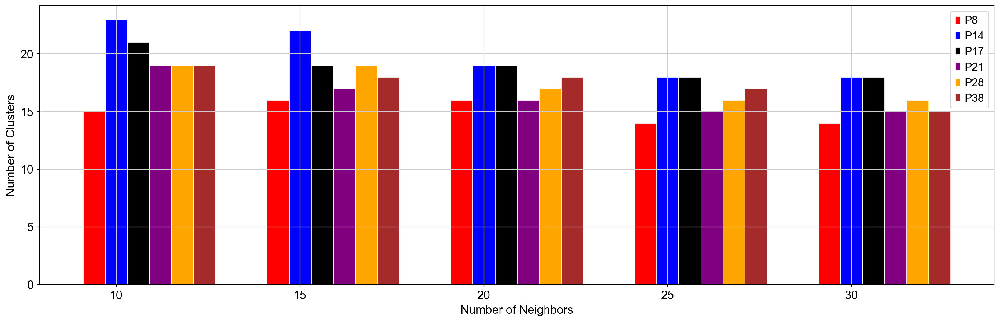

In [386]:
#code
fig, axs = plt.subplots(figsize=(20,6))

# set width of bar
barWidth = 0.12
 
# set height of bar
bars1 = [15, 16, 16, 14, 14]
bars2 = [23, 22, 19, 18, 18]
bars3 = [21, 19, 19, 18, 18]
bars4 = [19, 17, 16, 15, 15]
bars5 = [19, 19, 17, 16, 16]
bars6 = [19, 18, 18, 17, 15]

 
# Set position of bar on X axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]


 
# Make the plot
axs.bar(r1, bars1, color='red', width=barWidth, edgecolor='white', label='P8')
axs.bar(r2, bars2, color='blue', width=barWidth, edgecolor='white', label='P14')
axs.bar(r3, bars3, color='black', width=barWidth, edgecolor='white', label='P17')
axs.bar(r4, bars4, color='purple', width=barWidth, edgecolor='white', label='P21')
axs.bar(r5, bars5, color='orange', width=barWidth, edgecolor='white', label='P28')
axs.bar(r6, bars6, color='brown', width=barWidth, edgecolor='white', label='P38')

 
# Add xticks on the middle of the group bars
plt.xlabel('Number of Neighbors')
plt.xticks([r + barWidth for r in range(len(bars1))], ['10', '15', '20', '25', '30'])
plt.ylabel('Number of Clusters')

# Create legend & Show graphic
plt.legend()
#axs.show()


# Read

In [3]:
P8_gaba = sc.read_h5ad('P8_gaba0828.h5ad')

In [4]:
P8_gaba.obs

,batch,n_genes,percent_mito,n_counts,leiden,Doublet,Doublet Score,cluster,Class_broad,cluster_name,sample
AAAGGATCAATGCAAA-1-P8_1a-P8,P8,4562,0.000168,17859.0,2,False,0.027921,Inh_4,Inhibitory,Sst_D,P8_1a
AAATGGAAGGTAGTCG-1-P8_1a-P8,P8,3189,0.000508,9844.0,4,False,0.003329,Inh_3,Inhibitory,Pvalb_A,P8_1a
AAATGGATCATAAGGA-1-P8_1a-P8,P8,3551,0.000245,12258.0,3,False,0.003329,Inh_3,Inhibitory,Pvalb_B,P8_1a
AACAAAGAGACTCTTG-1-P8_1a-P8,P8,4434,0.000052,19080.0,2,False,0.013162,Inh_4,Inhibitory,Sst_C,P8_1a
AACAACCTCTGACAGT-1-P8_1a-P8,P8,4642,0.000095,21015.0,11,False,0.024667,Inh_2,Inhibitory,Stac,P8_1a
...,...,...,...,...,...,...,...,...,...,...,...
TTGTGGAAGGCTTCCG-1-P8_2b-P8,P8,1700,0.000319,3130.0,0,False,0.004110,Inh_1,Inhibitory,Meis2_A,P8_2b
TTGTTCAGTCTGTCAA-1-P8_2b-P8,P8,1038,0.001070,1870.0,0,False,0.005058,Inh_1,Inhibitory,Meis2_A,P8_2b
TTGTTGTAGTATAGGT-1-P8_2b-P8,P8,1125,0.003765,1859.0,0,False,0.005718,Inh_1,Inhibitory,Meis2_A,P8_2b
TTTCCTCAGCACTGGA-1-P8_2b-P8,P8,1147,0.000000,1968.0,13,False,0.003804,Inh_1,Inhibitory,Meis2_C,P8_2b


In [6]:
P8_gaba.obs.cluster_name.values.categories

Index(['Frem1', 'Lamp5_A', 'Lamp5_B', 'Meis2_A', 'Meis2_B', 'Meis2_C',
       'Pvalb_A', 'Pvalb_B', 'Pvalb_C', 'Pvalb_D', 'Sst_A', 'Sst_B', 'Sst_C',
       'Sst_D', 'Sst_E', 'Stac', 'Vip_A', 'Vip_B', 'Vip_C'],
      dtype='object')